The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats as st

In [2]:
data = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")
data.head(5)

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [3]:
data.shape

(3998, 39)

In [4]:
data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

We can ignore the unnamed column as it looks like there is no much importance for that column in the dataset, therefore we can slice the dataframe.

In [5]:
aspiring_data = data.iloc[:,1:]
aspiring_data.columns

Index(['ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [6]:
aspiring_data.shape

(3998, 38)

In [7]:
np.round(aspiring_data.describe())

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,...,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0
mean,663795.0,307700.0,78.0,2008.0,74.0,5157.0,2.0,71.0,5157.0,0.0,...,91.0,23.0,16.0,32.0,3.0,-0.0,0.0,0.0,-0.0,-0.0
std,363218.0,212737.0,10.0,2.0,11.0,4802.0,0.0,8.0,4802.0,0.0,...,175.0,98.0,88.0,105.0,37.0,1.0,1.0,1.0,1.0,1.0
min,11244.0,35000.0,43.0,1995.0,40.0,2.0,1.0,6.0,2.0,0.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-4.0,-6.0,-5.0,-3.0,-7.0
25%,334284.0,180000.0,72.0,2007.0,66.0,494.0,2.0,66.0,494.0,0.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.0,-1.0,-1.0,-1.0
50%,639600.0,300000.0,79.0,2008.0,74.0,3879.0,2.0,72.0,3879.0,0.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-0.0,-0.0
75%,990480.0,370000.0,86.0,2009.0,83.0,8818.0,2.0,76.0,8818.0,1.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0
max,1298275.0,4000000.0,98.0,2013.0,99.0,18409.0,2.0,100.0,18409.0,1.0,...,715.0,623.0,676.0,548.0,516.0,2.0,2.0,3.0,3.0,2.0


Let us look for numerical and categorical columns in the dataset

In [8]:
categorical = list()
numerical = list()
other = list()
for c,t in zip(aspiring_data.dtypes.index.to_list(),aspiring_data.dtypes.to_list()):
    if t=="object":
        categorical.append([c,t])
    elif t=="int64" or t=="float64":
        numerical.append([c,t])
    else:
        other.append([c,t])

print("Numerical Columns: ",numerical)
print("\nCategorical Columns: ",categorical)
print("\nOther Columns: ",other)

Numerical Columns:  [['ID', dtype('int64')], ['Salary', dtype('int64')], ['10percentage', dtype('float64')], ['12graduation', dtype('int64')], ['12percentage', dtype('float64')], ['CollegeID', dtype('int64')], ['CollegeTier', dtype('int64')], ['collegeGPA', dtype('float64')], ['CollegeCityID', dtype('int64')], ['CollegeCityTier', dtype('int64')], ['GraduationYear', dtype('int64')], ['English', dtype('int64')], ['Logical', dtype('int64')], ['Quant', dtype('int64')], ['Domain', dtype('float64')], ['ComputerProgramming', dtype('int64')], ['ElectronicsAndSemicon', dtype('int64')], ['ComputerScience', dtype('int64')], ['MechanicalEngg', dtype('int64')], ['ElectricalEngg', dtype('int64')], ['TelecomEngg', dtype('int64')], ['CivilEngg', dtype('int64')], ['conscientiousness', dtype('float64')], ['agreeableness', dtype('float64')], ['extraversion', dtype('float64')], ['nueroticism', dtype('float64')], ['openess_to_experience', dtype('float64')]]

Categorical Columns:  [['DOL', dtype('O')], ['De

In [9]:
#missing values
aspiring_data.isnull().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

We can see that DOL column has some values as "present". Let us change that value to current date. Also, we change DOJ, DOB, DOL timestamp columns to date columns.

In [10]:
import datetime as dt
aspiring_data['DOJ'] = pd.to_datetime(aspiring_data['DOJ']).dt.date
aspiring_data['DOB'] = pd.to_datetime(aspiring_data['DOJ']).dt.date
aspiring_data['DOL'].replace("present",dt.datetime.today(),inplace=True)
aspiring_data['DOL'] = pd.to_datetime(aspiring_data['DOJ']).dt.date

In [11]:
aspiring_data.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000,2012-06-01,2012-06-01,senior quality engineer,Bangalore,f,2012-06-01,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000,2013-09-01,2013-09-01,assistant manager,Indore,m,2013-09-01,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000,2014-06-01,2014-06-01,systems engineer,Chennai,f,2014-06-01,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000,2011-07-01,2011-07-01,senior software engineer,Gurgaon,m,2011-07-01,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000,2014-03-01,2014-03-01,get,Manesar,m,2014-03-01,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In the Designation column, we can see that there is a dummy value 'get'. So, we will replace it with the mode value.

In [12]:
aspiring_data[aspiring_data["Designation"]=="get"][["JobCity","Gender","10percentage","10board","12percentage","12board","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,JobCity,Gender,10percentage,10board,12percentage,12board,Degree,Specialization,CollegeState,GraduationYear
0,Hyderabad,m,80.0,cbse,64.20,cbse,B.Tech/B.E.,mechanical engineering,Uttar Pradesh,2014.0
1,NaN,NaN,NaN,NaN,67.00,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,72.00,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,73.40,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,73.80,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,74.40,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,74.53,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,76.00,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,76.80,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,79.90,NaN,NaN,NaN,NaN,NaN


In [13]:
getValue = []
getValue.append(aspiring_data[aspiring_data["JobCity"]=="Hyderabad"]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Gender"]=="m"]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["10percentage"]==80]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["10board"]=="cbse"]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["12percentage"]==64.2]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["12board"]=="cbse"]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Degree"].str.startswith("B.Tech/")]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Specialization"].str.startswith("mechanical")]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["CollegeState"].str.startswith("Uttar Pradesh")]["Designation"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["GraduationYear"]==2014]["Designation"].mode().to_list()[0])
getValue

['software engineer',
 'software engineer',
 'software engineer',
 'software engineer',
 'get',
 'software engineer',
 'software engineer',
 'production engineer',
 'software engineer',
 'software engineer']

In [14]:
designation_value=pd.DataFrame({"DesignationValue":getValue})
designation_value=designation_value["DesignationValue"].mode().to_list()[0]
aspiring_data["Designation"].replace("get",designation_value,inplace=True)

In [15]:
aspiring_data[aspiring_data["Designation"]=="get"]

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience


In the Job City column, we can see that there is a dummy value '-1'. So, we will replace it with the mode value.

In [16]:
aspiring_data[aspiring_data["JobCity"]==-1][["Designation","10percentage","12percentage","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Designation,10percentage,12percentage,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,software engineer,76.0,64.0,70.0,200000.0,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh,2013.0
1,NaN,78.0,66.0,72.0,NaN,NaN,NaN,NaN,NaN
2,NaN,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
getValue = []
getValue.append(aspiring_data[aspiring_data["Designation"]=="software engineer"]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Gender"]=="m"]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["10percentage"]==76]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["10board"]=="cbse"]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["12percentage"]==64]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["12board"]=="cbse"]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["collegeGPA"]==70]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Salary"]==200000]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Degree"].str.startswith("B.Tech/")]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Specialization"].str.startswith("electronics and communication eng")]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["CollegeState"].str.startswith("Uttar Pradesh")]["JobCity"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["GraduationYear"]==2013]["JobCity"].mode().to_list()[0])
getValue

['Bangalore',
 'Bangalore',
 -1,
 'Noida',
 -1,
 'Noida',
 'Bangalore',
 -1,
 'Bangalore',
 'Bangalore',
 'Noida',
 'Bangalore']

In [18]:
jobcity_value=pd.DataFrame({"JobCityValue":getValue})
jobcity_value=jobcity_value["JobCityValue"].mode().to_list()[0]
aspiring_data["JobCity"].replace(-1,jobcity_value,inplace=True)

In [19]:
aspiring_data[aspiring_data["JobCity"]==-1]

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience


In the 10board column, we can see that there is a dummy value '0'. So, we will replace it with the mode value.

In [20]:
aspiring_data[aspiring_data["10board"]==0][["Gender","JobCity","Designation","10percentage","12percentage","12board","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Gender,JobCity,Designation,10percentage,12percentage,12board,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,m,Bangalore,software engineer,75.0,65.0,0,65.0,400000.0,B.Tech/B.E.,computer engineering,Tamil Nadu,2012.0
1,NaN,NaN,NaN,NaN,NaN,NaN,72.0,NaN,NaN,NaN,NaN,NaN


In [21]:
getValue = []
getValue.append(aspiring_data[aspiring_data["Designation"]=="software engineer"]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Gender"]=="m"]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["10percentage"]==75]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["JobCity"]=="Bangalore"]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["12percentage"]==65]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["collegeGPA"]==65]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Salary"]==400000]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Degree"].str.startswith("B.Tech/")]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["Specialization"].str.startswith("computer eng")]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["CollegeState"].str.startswith("Tamil Nadu")]["10board"].mode().to_list()[0])
getValue.append(aspiring_data[aspiring_data["GraduationYear"]==2012]["10board"].mode().to_list()[0])
getValue

['cbse',
 'cbse',
 'cbse',
 'cbse',
 'cbse',
 'cbse',
 'cbse',
 'cbse',
 'cbse',
 'state board',
 'cbse']

In [22]:
sscBoardValue=pd.DataFrame({"sscBoardValue":getValue})
sscBoardValue=sscBoardValue["sscBoardValue"].mode().to_list()[0]
aspiring_data["10board"].replace(0,sscBoardValue,inplace=True)

In [23]:
aspiring_data[aspiring_data["10board"]==0]

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience


In the 12board column, we can see that there is a dummy value '0'. So, we will replace it with the mode value.

In [24]:
aspiring_data[aspiring_data["12board"]==0][["Gender","JobCity","Designation","10percentage","12percentage","12board","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Gender,JobCity,Designation,10percentage,12percentage,12board,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,m,Bangalore,software engineer,75.0,65.0,0,65.0,400000.0,B.Tech/B.E.,computer engineering,Tamil Nadu,2012.0
1,NaN,NaN,system engineer,NaN,NaN,NaN,72.0,NaN,NaN,NaN,NaN,NaN


We can observe that 12board has same values like that of 10board, therefore we can assign same mode values.

In [25]:
aspiring_data["12board"].replace(0,sscBoardValue,inplace=True)

In [26]:
aspiring_data[aspiring_data["12board"]==0]

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience


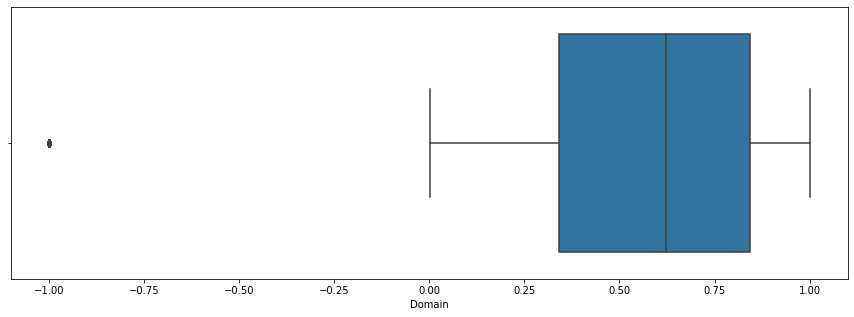

In [27]:
#analyzing domain column
plt.figure(figsize=(15,5))
sns.boxplot(x="Domain",data=aspiring_data)

From the above boxplot, we can see some outliers in the Domain column. Therefore, we replace the outlier value with the median value.

In [28]:
aspiring_data["Domain"].replace(-1,aspiring_data["Domain"].median(),inplace=True)

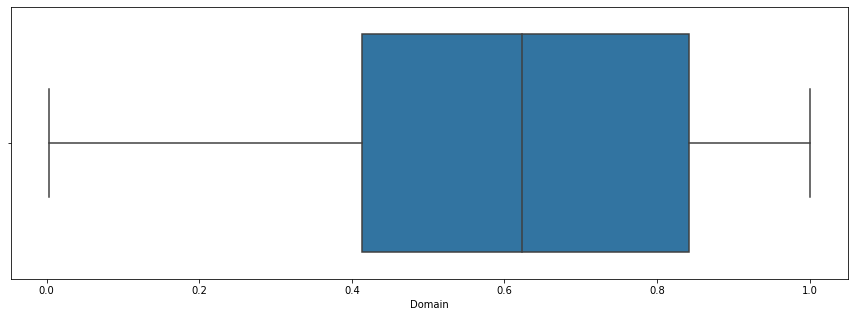

In [29]:
plt.figure(figsize=(15,5))
sns.boxplot(x="Domain",data=aspiring_data)

We can observe from the above boxplot that outliers are removed after replacing the outlier value with median value.

In [30]:
#Correlation between the variables
aspiring_data.corr()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.284540,0.035160,0.047144,0.284540,-0.035977,...,0.482626,-0.026147,0.104454,-0.049272,-0.017871,0.175557,0.024837,0.120979,-0.146289,0.031359
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.118690,-0.179332,0.130103,-0.118690,0.015384,...,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,0.021082,-0.126042,0.312538,0.021082,0.116707,...,-0.018933,0.050364,0.074419,0.049378,0.030002,0.067657,0.136645,-0.004679,-0.132496,0.036692
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.254021,0.027691,0.086001,0.254021,-0.003016,...,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,0.022336,-0.100771,0.346137,0.022336,0.130462,...,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
CollegeID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,0.067054,1.000000,-0.086781,0.067054,-0.101494,...,0.001053,-0.021548,0.002594,0.000007,-0.033722,0.055174,-0.038055,0.009970,0.023778,-0.019179
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,0.017240,-0.086781,1.000000,0.017240,0.017471,...,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
CollegeCityID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,0.007757,-0.101494,0.017471,0.007757,1.000000,...,-0.010643,-0.052395,0.010311,0.049876,-0.033392,0.014763,0.005565,-0.008203,0.004442,-0.016790


From the above plot, we can see that the correlation values are not close to -1 and 1, therefore we can say that the variables are independent.

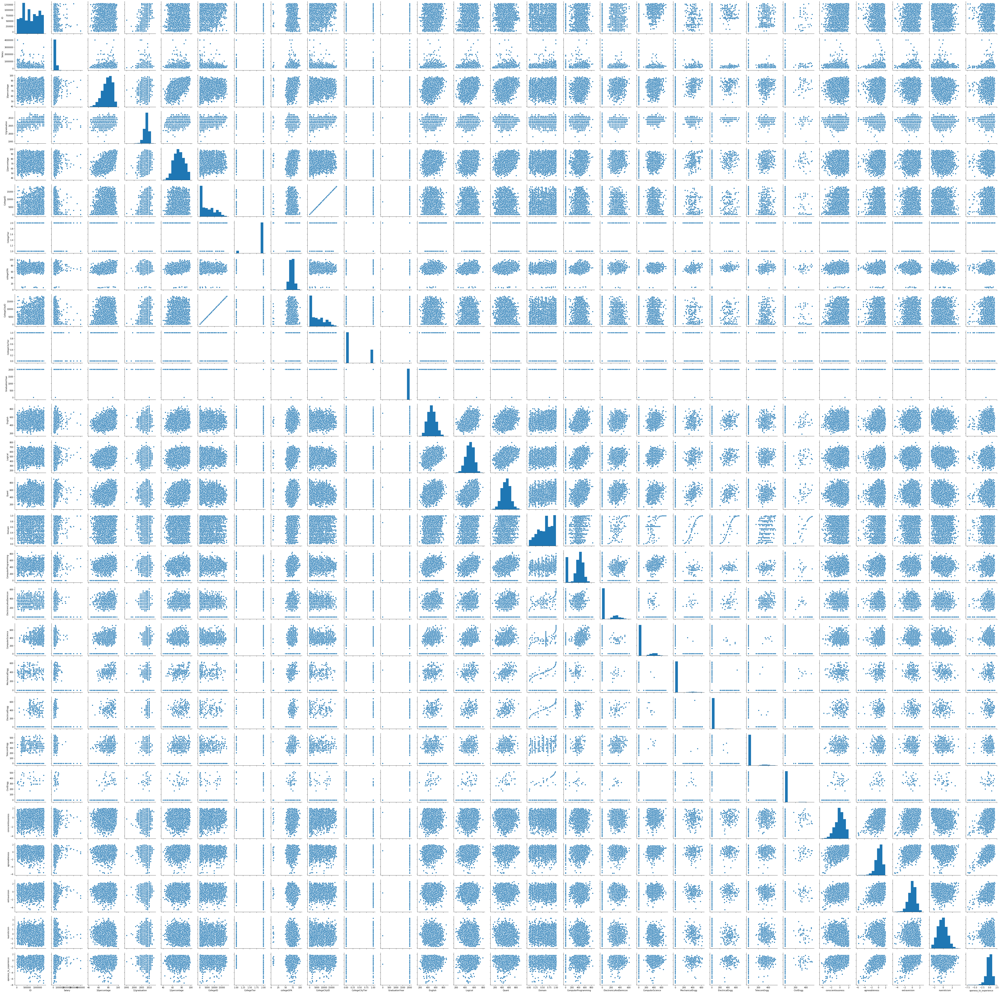

In [31]:
sns.pairplot(aspiring_data)

Let us test the following claims:
1. “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.”
2. Is there a relationship between gender and specialisation?

In [32]:
aspiring_data["Experience"]=pd.to_datetime(aspiring_data["DOL"]).dt.year-pd.to_datetime(aspiring_data["DOJ"]).dt.year
fresher_data=aspiring_data[(aspiring_data["Designation"].isin(["programmer analyst","software engineer","hardware engineer","associate engineer"])) & (aspiring_data["Experience"]<1)][["Designation","Salary","Gender","Specialization"]]
fresher_data.head()

,Designation,Salary,Gender,Specialization
4,software engineer,200000,m,electronics and communication engineering
19,software engineer,325000,f,computer engineering
20,software engineer,320000,f,computer engineering
21,software engineer,200000,f,information technology
24,programmer analyst,335000,m,computer science & engineering


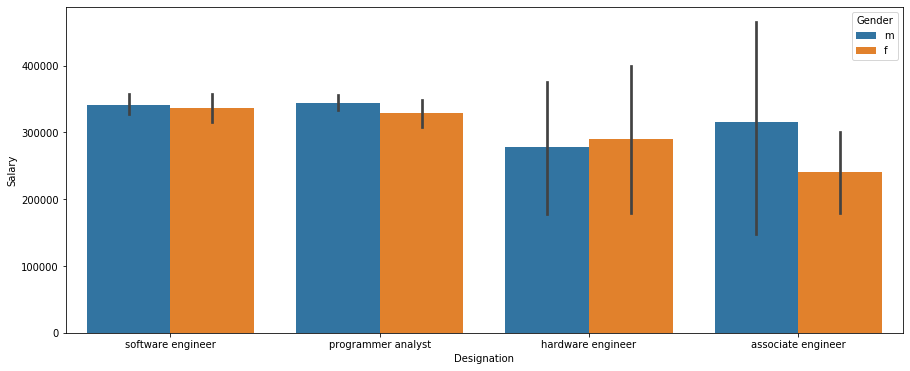

In [33]:
plt.figure(figsize=(15,6))
sns.barplot(x="Designation",y="Salary",hue="Gender",data=fresher_data)

In [34]:
fresher_data['Salary'].mean()

339199.716713881

From the above plot, we can see that the minimum salary for the freshers is above 200K. We can test this using chi2_contingency test.

In [35]:
from scipy import stats as st
from scipy.stats import chi2_contingency as cst
pv=st.ttest_1samp(fresher_data["Salary"],popmean=330000)[1]
if pv<0.05:
    print("We reject the null hypthesis and say that Avearge Salary for above fields is not 300K")
else:
    print("The avg salary for fresh grads is 300K")

The avg salary for fresh grads is 300K


From the above plot we can say that the claim that fresh graduate can earn upto 2.5 - 3 lakhs for certain IT roles is true.

{'whiskers': [<matplotlib.lines.Line2D at 0x19185ea8308>,
 'caps': [<matplotlib.lines.Line2D at 0x19185ea8b88>,
 'boxes': [<matplotlib.lines.Line2D at 0x19185ea69c8>],
 'medians': [<matplotlib.lines.Line2D at 0x19185eabb08>],
 'fliers': [<matplotlib.lines.Line2D at 0x19185eac9c8>],
 'means': []}

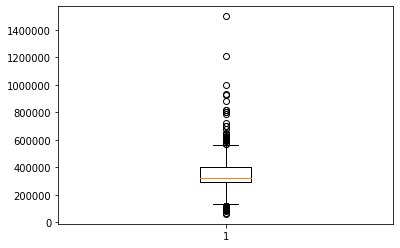

In [40]:
plt.boxplot(fresher_data['Salary'])

Let us consider the following hypothesis:
$H_O=$There is no relation between Gender and Specialization,Gender does not impacts Specialization
$H_1=$There is relation between Gender and Specialization,Gender impacts Specialization

In [36]:
dfsc=pd.crosstab(fresher_data["Gender"],fresher_data["Specialization"],margins=True)
pv_1=cst(dfsc)
if pv_1[1]<0.05:
    print("There is relation and gender does impact specializations")
else:
    print("There is no relation and gender doesnt impacts specializations")

There is no relation and gender doesnt impacts specializations


Therefore, the claim Specialization depends on Gender is false.

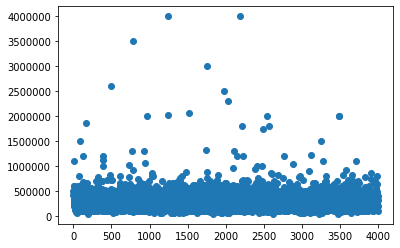

In [37]:
plt.scatter(aspiring_data.index,aspiring_data['Salary'])

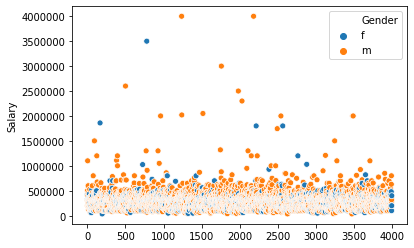

In [38]:
sns.scatterplot(aspiring_data.index,aspiring_data['Salary'],aspiring_data['Gender'])

From the above two plots, we can observe that most of the students, either female or male, have salary around Rs.500000

(array([3.70e+03, 0.00e+00, 0.00e+00, 2.43e+02, 0.00e+00, 0.00e+00,
        5.30e+01, 0.00e+00, 0.00e+00, 2.00e+00]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

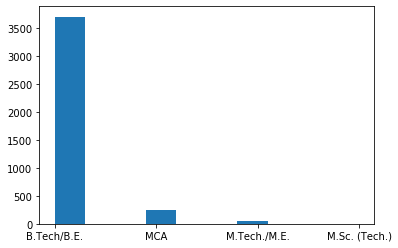

In [39]:
plt.hist(aspiring_data['Degree'])

From the above plot, we can say that most of the students have B.Tech / B.E as their degree. 

In [46]:
data1 = aspiring_data[aspiring_data['Degree']=='B.Tech/B.E.']
data1.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Experience
0,203097,420000,2012-06-01,2012-06-01,senior quality engineer,Bangalore,f,2012-06-01,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,0
1,579905,500000,2013-09-01,2013-09-01,assistant manager,Indore,m,2013-09-01,85.4,cbse,...,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,0
2,810601,325000,2014-06-01,2014-06-01,systems engineer,Chennai,f,2014-06-01,85.0,cbse,...,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,0
3,267447,1100000,2011-07-01,2011-07-01,senior software engineer,Gurgaon,m,2011-07-01,85.6,cbse,...,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,0
4,343523,200000,2014-03-01,2014-03-01,software engineer,Manesar,m,2014-03-01,78.0,cbse,...,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,0


In [52]:
data1['Designation'].mode()

0    software engineer
dtype: object

We can say that the most of the Engineering graduates are now  working as Software Engineer.

(array([  0.,  20.,  40.,  60.,  80., 100., 120.]),
 <a list of 7 Text yticklabel objects>)

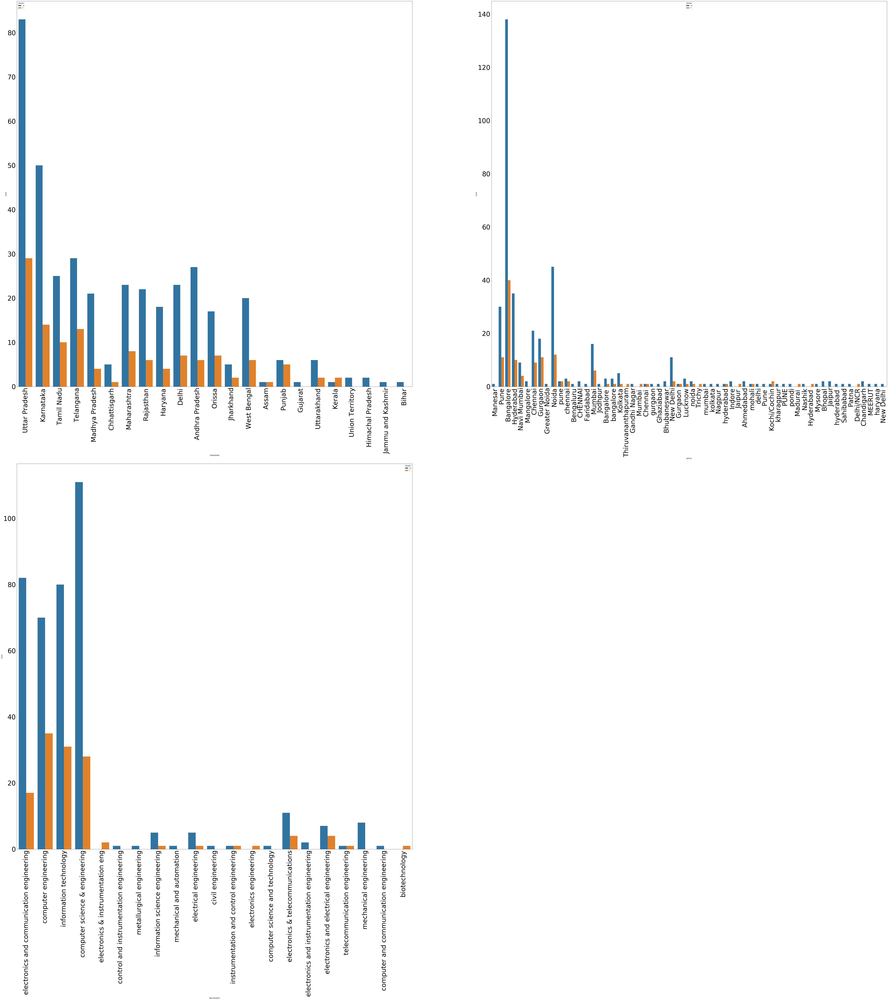

In [56]:
plt.figure(figsize=(100,100))
plt.subplot(221)
sns.countplot(x="CollegeState",hue="Gender",data=data1[data1["Designation"]=="software engineer"])
plt.xticks(fontsize=42,rotation=90)
plt.yticks(fontsize=42)
plt.subplot(222)
sns.countplot(x="JobCity",hue="Gender",data=data1[data1["Designation"]=="software engineer"])
plt.xticks(fontsize=42,rotation=90)
plt.yticks(fontsize=42)
plt.subplot(223)
sns.countplot(x="Specialization",hue="Gender",data=data1[data1["Designation"]=="software engineer"])
plt.xticks(fontsize=42,rotation=90)
plt.yticks(fontsize=42)

In [57]:
data1['Salary'].mean()

308622.7027027027

From the above plot, we can say that most of the Engineering graduates who are now working as Software Engineers are from Computer Science Engineering background and Uttar Pradesh state and currently working in Bangalore and earning around 300K.